<a href="https://colab.research.google.com/github/suchusername/nfl_impact_detection/blob/main/NflEdaOfImages.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [2]:
cd drive/My\ Drive

/content/drive/My Drive


In [3]:
cd Colab\ Notebooks

/content/drive/My Drive/Colab Notebooks


In [22]:
import pandas as pd
from matplotlib import pyplot as plt
import cv2
import numpy as np
import os
import sys
sys.path.append('nfl_impact_detection/utils')
import importlib
from draw_bboxes import draw_bboxes, draw_bboxes_from_df
from scipy import stats

In [14]:
# 1. We have folder "images", its for helmet bboxes detection only

In [15]:
# "image_labels.csv" contains markup for each image in "images"
img_labels = pd.read_csv('image_labels.csv')
img_labels.head()

,image,label,left,width,top,height
0,57503_000116_Endzone_frame443.jpg,Helmet,1099,16,456,15
1,57503_000116_Endzone_frame443.jpg,Helmet,1117,15,478,16
2,57503_000116_Endzone_frame443.jpg,Helmet,828,16,511,15
3,57503_000116_Endzone_frame443.jpg,Helmet,746,16,519,16
4,57503_000116_Endzone_frame443.jpg,Helmet,678,17,554,17


In [16]:
# There are 193736 different bboxes for helmets
img_labels.shape

(193736, 6)

In [17]:
# Checked duplicated rows (no duplicates)
img_labels.drop_duplicates(inplace=True)
img_labels.shape

(193736, 6)

In [18]:
# However, there are only 9947 different images
img_labels.nunique()

image     9947
label        5
left      1278
width       88
top        718
height      90
dtype: int64

In [25]:
# Each image has (720, 1280) shape (need to check for all images)
img_path = img_labels['image'].values[0]
img = cv2.imread(os.path.join('images',img_path))
img.shape

(720, 1280, 3)

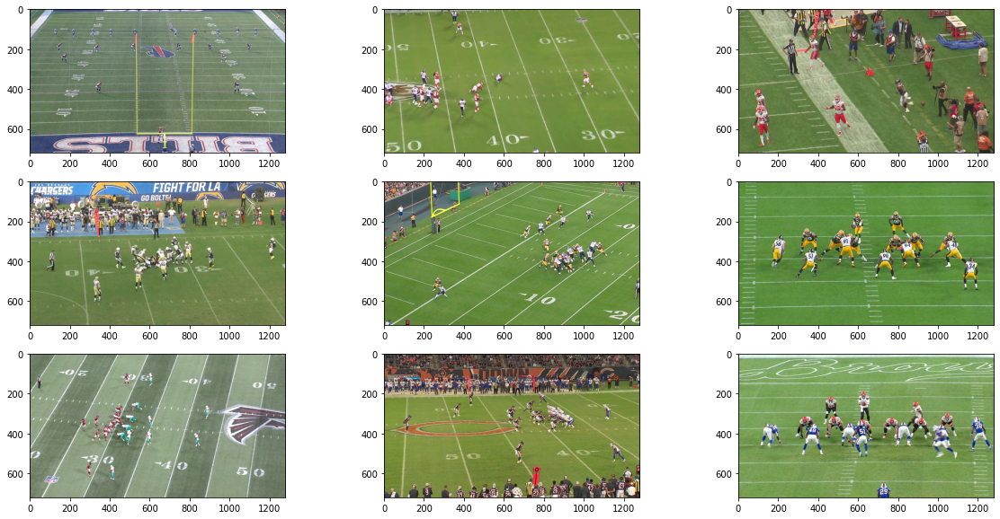

In [ ]:
# Images look like
fig, ax = plt.subplots(nrows=3, ncols=3, figsize=(20,10))
for row in ax:
  for col in row:
    img_path = img_labels['image'].values[np.random.randint(9947)]
    col.imshow(cv2.cvtColor(cv2.imread(os.path.join('images',img_path)), cv2.COLOR_BGR2RGB))

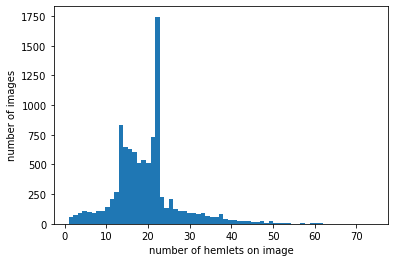

In [ ]:
# Distribution: count of images with particular number of helmets on image
# There is interesting peak at 22 helmets per image
plt.hist(img_labels.image.value_counts().values,
         bins = img_labels.image.value_counts().nunique()) # number of bins
plt.xlabel('number of hemlets on image')
plt.ylabel('number of images')
plt.show()

# We can check that mode of distribution is 22
md = stats.mode(img_labels.image.value_counts().values) # = 22


In [ ]:
# Lets look at the edge cases

img_labels.image.value_counts()

57505_004127_Sideline_frame239.jpg     74
57515_000677_Sideline_frame0892.jpg    68
57860_003813_Sideline_frame1071.jpg    66
57526_003948_Sideline_frame264.jpg     65
57522_001334_Sideline_frame1232.jpg    63
                                       ..
57750_003831_Endzone_frame431.jpg       1
57636_001968_Endzone_frame0708.jpg      1
57640_003850_Endzone_frame0975.jpg      1
57924_001420_Endzone_frame0959.jpg      1
57659_000933_Endzone_frame0901.jpg      1
Name: image, Length: 9947, dtype: int64

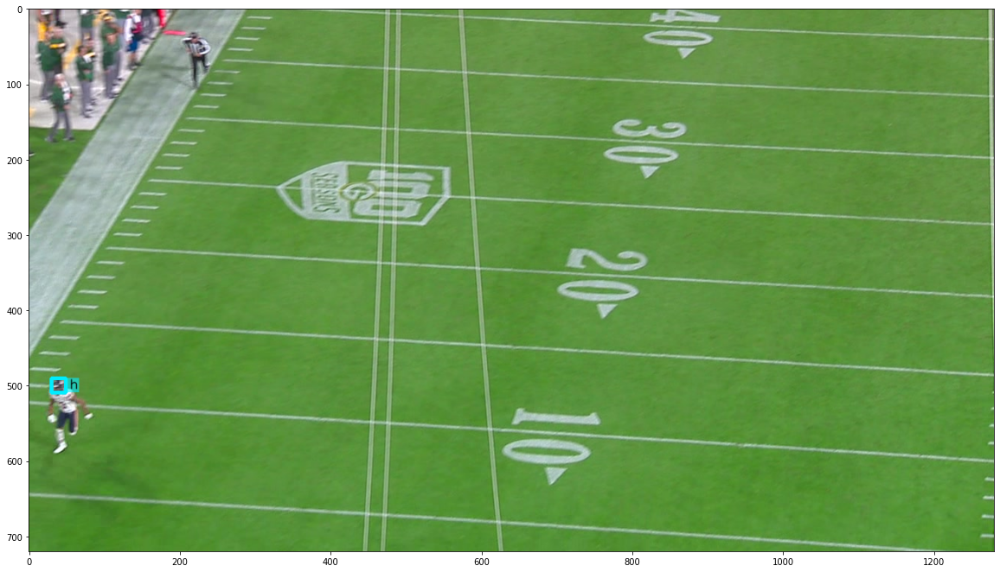

In [ ]:
# Where only one helmet

df = img_labels[img_labels['image'] == '57580_002775_Endzone_frame1230.jpg']
draw_bboxes_from_df(df)

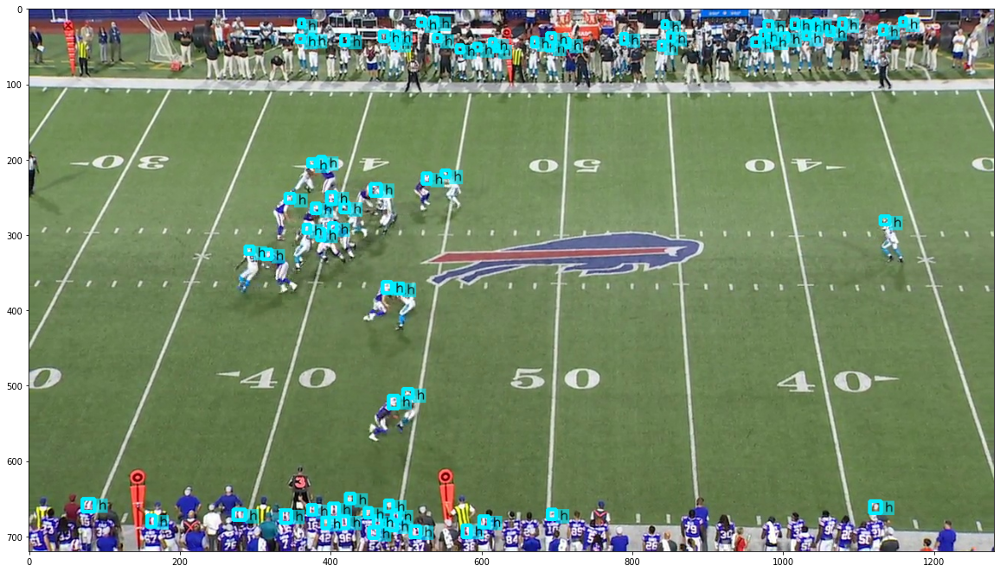

In [ ]:
# Where the most number of helmets (really hard case)

df = img_labels[img_labels['image'] == '57505_004127_Sideline_frame239.jpg']
draw_bboxes_from_df(df)

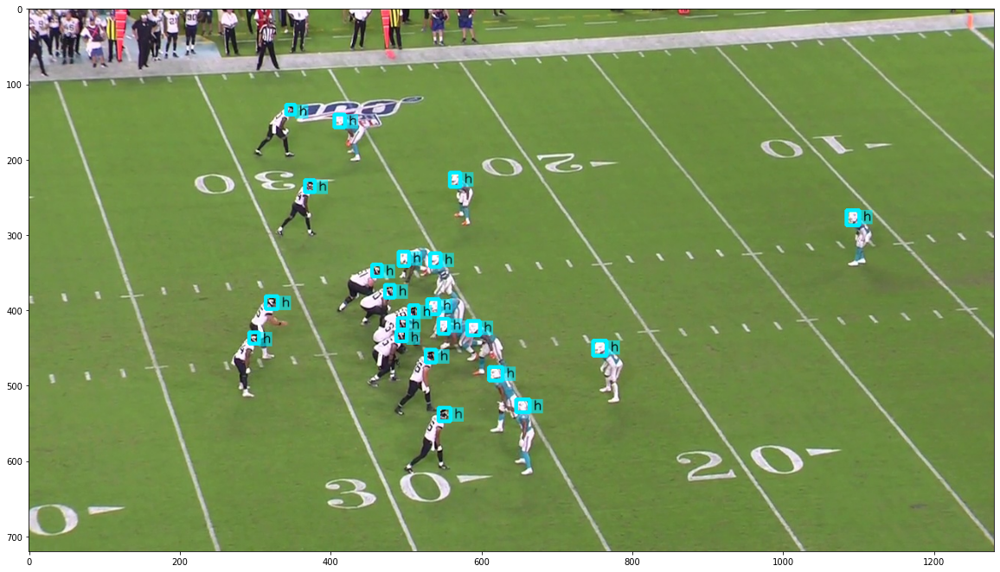

In [ ]:
# The most popular case (22 helmets) is a Start of the game

counts_df = pd.DataFrame(img_labels.image.value_counts().reset_index())
counts_df.columns = ['img_name','counts']
img_where_22_helmets = counts_df[counts_df['counts'] == 22]['img_name'].values[0] 
df = img_labels[img_labels['image'] == img_where_22_helmets]

draw_bboxes_from_df(df)

In [ ]:
# Types of helmets
img_labels.label.value_counts()

Helmet              129764
Helmet-Blurred       33544
Helmet-Sideline      15037
Helmet-Partial        8814
Helmet-Difficult      6577
Name: label, dtype: int64

In [26]:
blurred_img_path = img_labels[img_labels['label'] == 'Helmet-Blurred']['image'].values[0]
df = img_labels[(img_labels['label'] == 'Helmet-Blurred') & (img_labels['image'] == blurred_img_path)]

In [27]:
df

,image,label,left,width,top,height
20,57503_000116_Endzone_frame443.jpg,Helmet-Blurred,695,12,223,15
21,57503_000116_Endzone_frame443.jpg,Helmet-Blurred,649,9,447,11


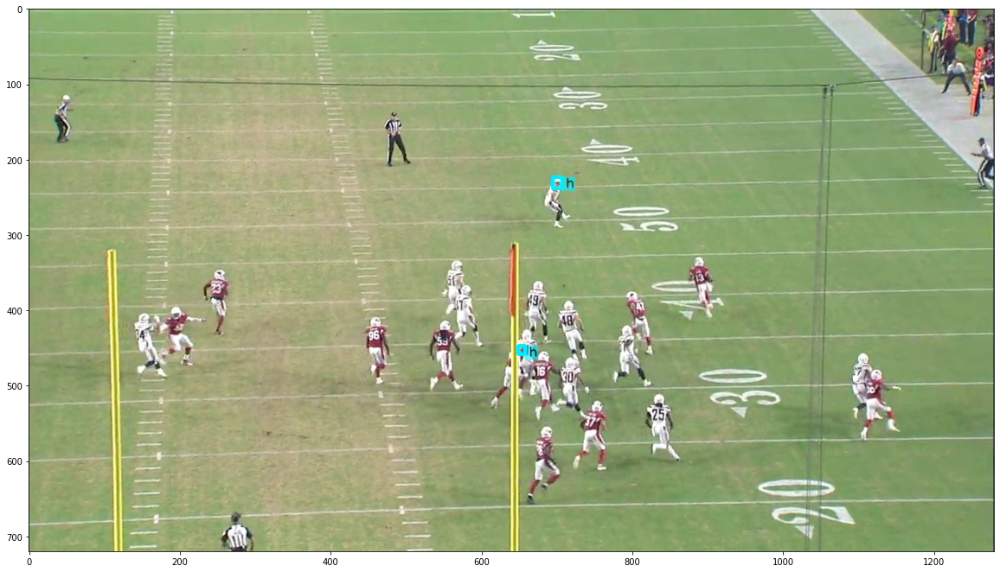

In [28]:
# Only 2 blurred Helmets on image

draw_bboxes_from_df(df)

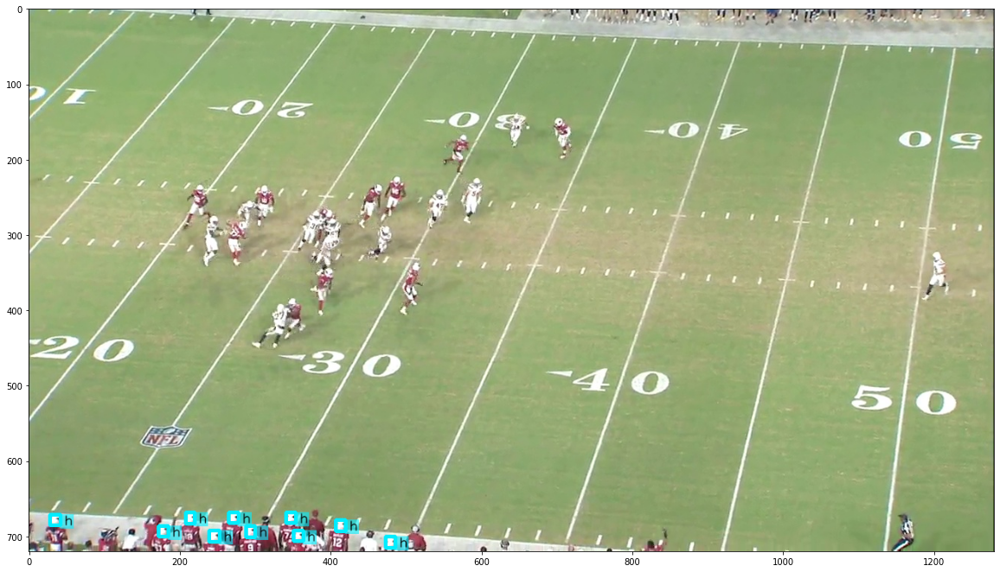

In [31]:
# Sideline Helmets
img_path = img_labels[img_labels['label'] == 'Helmet-Sideline']['image'].values[0]
df = img_labels[(img_labels['label'] == 'Helmet-Sideline') & (img_labels['image'] == img_path)]
draw_bboxes_from_df(df)

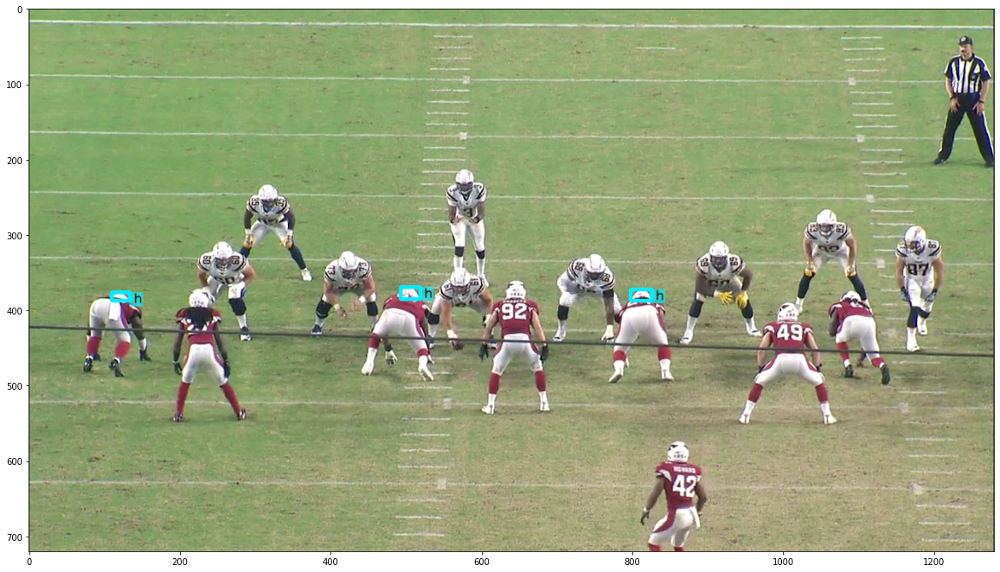

In [32]:
# Patrial Helmets
img_path = img_labels[img_labels['label'] == 'Helmet-Partial']['image'].values[0]
df = img_labels[(img_labels['label'] == 'Helmet-Partial') & (img_labels['image'] == img_path)]
draw_bboxes_from_df(df)

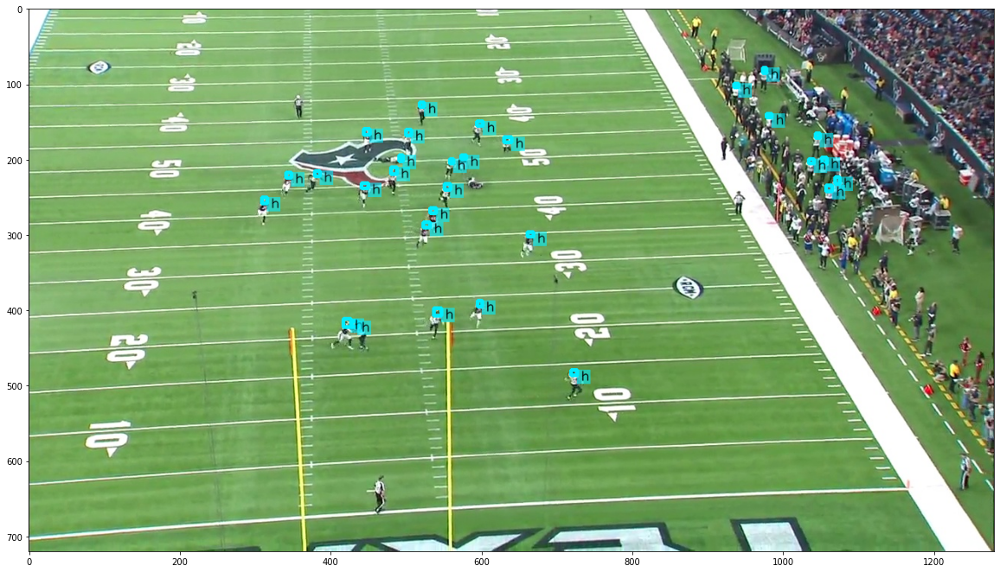

In [38]:
# Difficult Helmets
img_path = img_labels[img_labels['label'] == 'Helmet-Difficult']['image'].values[1000]
df = img_labels[(img_labels['label'] == 'Helmet-Difficult') & (img_labels['image'] == img_path)]
draw_bboxes_from_df(df)